## Cargar data

In [2]:
!git clone https://github.com/rffuente/INF-395-477---Tareas.git

Cloning into 'INF-395-477---Tareas'...
remote: Enumerating objects: 1, done.
remote: Counting objects: 100% (1/1), done.
remote: Total 28068 (delta 0), reused 0 (delta 0), pack-reused 28067
Receiving objects: 100% (28068/28068), 1.73 GiB | 38.67 MiB/s, done.
Resolving deltas: 100% (1600/1600), done.
Checking out files: 100% (25851/25851), done.


## Cargar embeders

In [3]:
!pip install git+https://github.com/facebookresearch/fastText.git

  Cloning https://github.com/facebookresearch/fastText.git to /tmp/pip-req-build-_km67tcl
  Running command git clone -q https://github.com/facebookresearch/fastText.git /tmp/pip-req-build-_km67tcl
  Created wheel for fasttext: filename=fasttext-0.9.2-cp36-cp36m-linux_x86_64.whl size=3013618 sha256=fa65ffbf0943dff787a0af7508c635c88e2552d1a11fdbbcae230fb54c117a87
  Stored in directory: /tmp/pip-ephem-wheel-cache-6vvdb4fp/wheels/69/f8/19/7f0ab407c078795bc9f86e1f6381349254f86fd7d229902355
Successfully built fasttext


In [4]:
!pip install sister

     |████████████████████████████████| 21.5MB 7.9MB/s 
  Created wheel for sister: filename=sister-0.1.10-cp36-none-any.whl size=5393 sha256=ae169327a6c05411a087bcfb5a0e1372661e7d75b60270fa7216db3cdc950267
  Stored in directory: /root/.cache/pip/wheels/69/8d/01/c066cc2e5c98891fc1af11f393882ee718b6026f3f8b0623b0
Successfully built sister


## Cargar librerias

In [5]:
import matplotlib.pyplot as plt
import pandas as pd
import pickle
import numpy as np
import os
from os import walk
import tensorflow as tf
from keras.applications.resnet50 import ResNet50
from keras.optimizers import Adam
from keras.layers import Dense, Flatten,Input, Convolution2D, Dropout, LSTM, TimeDistributed, Embedding, Bidirectional, Activation, RepeatVector,Concatenate
from keras.models import Sequential, Model, Input
from keras.utils import np_utils, Sequence
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
import random
from keras.preprocessing import image, sequence
import matplotlib.pyplot as plt
from scipy.spatial.distance import cosine as cosine_distante
from sklearn.utils import shuffle

In [6]:
import sister
embedder = sister.MeanEmbedding(lang="en")

Loading model...


## rutas

In [7]:
path_text = "INF-395-477---Tareas/Taller_3/Propuesta/Flickr8k_text/"
#path_data = "INF-395-477---Tareas/Taller_3/Propuesta/Flicker8k_Dataset/"

#images_dir = os.listdir("../input/flickr_data/Flickr_Data/")

images_path = "INF-395-477---Tareas/Taller_3/Propuesta/Flicker8k_Dataset/"
captions_path = "INF-395-477---Tareas/Taller_3/Propuesta/Flickr8k_text/Flickr8k.token.txt"
train_path = "INF-395-477---Tareas/Taller_3/Propuesta/Flickr8k_text/Flickr_8k.trainImages.txt"
val_path = "INF-395-477---Tareas/Taller_3/Propuesta/Flickr8k_text/Flickr_8k.devImages.txt"
test_path = "INF-395-477---Tareas/Taller_3/Propuesta/Flickr8k_text/Flickr_8k.testImages.txt"

In [8]:
def open_files(path):
  pair = {}
  file = open(path)
  for line in file:
      line = line.strip()
      pair[line] = []
  file.close()
  return pair

def larges(pair):
  l = []
  for v in pair.values():
    l.append(len(v))
  return set(l)

In [9]:
train_pair = open_files(train_path)
val_pair = open_files(val_path)

#rellenamos pares de train y validation con captions
caption_file = open(captions_path)
for line in caption_file:
    identifier, caption = line.strip().split("\t")
    _id, _c = identifier.split("#")
    if _id in train_pair.keys():
        if caption not in train_pair[_id]:
            train_pair[_id].append(caption)
    elif _id in val_pair.keys():
        if caption not in val_pair[_id]:
            val_pair[_id].append(caption)

largos_train = larges(train_pair)  
largos_val = larges(val_pair)  

print(len(train_pair), largos_train)
print(len(val_pair), largos_val)

6000 {4, 5}
1000 {5}


In [10]:
#Reduccion de dimension de las imagenes
files = walk(images_path)
names = []
for _,_,f in files:
    for x in f:
        names.append(x)

fl = 0.1
count = 0
#total = len(names)

dims = []
for n in names:
    image = img_to_array(load_img(images_path + n))
    dims.append(image.shape)
    count += 1
    if (count / len(names)) > fl:
        print(fl)
        fl += 0.1

dims = set(dims)
par_x = 1000
par_y = 1000
max = 1000000

for t in dims:
    s = t[0]*t[1]
    if s < max:
        par_x = t[0]
        par_y = t[1]
        max = s

print(par_x, par_y)

0.1
0.2
0.30000000000000004
0.4
0.5
0.6
0.7
0.7999999999999999
0.8999999999999999
0.9999999999999999
191 288


In [11]:
## Cargamos una fraccion de las imagenes porque no alcanzan todas en ram, al menos el colab.
filenames_train = []
labels_train = []

filenames_val = []
labels_val = []

count = 0

for k, v in train_pair.items():
    for i in range(1):
        filenames_train.append(k)
        labels_train.append(v[i])
    count += 1
    ## Cargamos solo 2000 imagenes.
    if count == 2000:
        break

for k, v in val_pair.items():
    for i in range(1):
        filenames_val.append(k)
        labels_val.append(v[i])
        
filenames_train = np.array(filenames_train).reshape(len(filenames_train), 1)
labels_train = np.array(labels_train).reshape(len(labels_train), 1)

filenames_val = np.array(filenames_val).reshape(len(filenames_val), 1)
labels_val = np.array(labels_val).reshape(len(labels_val), 1)

print("train shapes", filenames_train.shape, labels_train.shape)
print("val shapes", filenames_val.shape, labels_val.shape)

train shapes (2000, 1) (2000, 1)
val shapes (1000, 1) (1000, 1)


In [12]:
filenames_train_shuffle, labels_train_shuffle = shuffle(filenames_train, labels_train) 
filenames_val_shuffle, labels_val_shuffle = shuffle(filenames_val, labels_val) 

In [13]:
class Generator(Sequence):
    def __init__(self, filenames_train, labels_train, bath_size):
        self.filenames_train = filenames_train
        self.labels_train = labels_train
        self.batch_size = batch_size
        
    def __len__(self):
        #numero de batch por epochs
        return (np.ceil( len(self.filenames_train) / float(self.batch_size) ) ).astype(np.int)
    
    def __getitem__(self, idx):
        #Generar indices de los batchs
        batch_x = self.filenames_train[idx * self.batch_size : (idx+1) * self.batch_size]
        batch_y = self.labels_train[idx * self.batch_size : (idx+1) * self.batch_size]
        
        vectorized_y = np.array([embedder(x[0]) for x in batch_y])
        
        imagenes = np.array([img_to_array( load_img( images_path + x[0], target_size=(191,228)) ) for x in batch_x] )
        
        return imagenes, vectorized_y
    
batch_size = 32
train_generator = Generator(filenames_train_shuffle,labels_train_shuffle, batch_size)
val_generator = Generator(filenames_val_shuffle,labels_val_shuffle, batch_size)
STEP_TRAIN = filenames_train_shuffle.shape[0]
STEP_VAL = filenames_val_shuffle.shape[0]

In [14]:
#Se prueba con RestNet50, pero no funciono muy bien.
# Loading 50 layer Residual Network Model and getting the summary of the model
from IPython.core.display import display, HTML
display(HTML("""<a href="http://ethereon.github.io/netscope/#/gist/db945b393d40bfa26006">ResNet50 Architecture</a>"""))
model = ResNet50(include_top=False,weights='imagenet',input_shape=(224,224,3),pooling='avg')
#model.summary()
# Note: For more details on ResNet50 architecture you can click on hyperlink given below

94773248/94765736 [==============================] - 1s 0us/step


In [15]:
from tensorflow.keras.losses import CosineSimilarity as cos_sim
from tensorflow import keras
from tensorflow.keras import Sequential
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing
#Agregamos data augemntation
data_augmentation = Sequential(
    [
        preprocessing.RandomRotation(0.1),
        preprocessing.RandomFlip("horizontal")
    ]
)

#base_model = ResNet50(include_top=False,weights='imagenet',input_shape=(224,224,3))
base_model = keras.applications.InceptionResNetV2(include_top=False,weights='imagenet',input_shape=(191,228,3))
base_model.trainable = False

inputs = keras.Input(shape=(191,228,3))
x = data_augmentation(inputs)

norm_layer = preprocessing.Normalization()
m = np.array([255/2, 255/2, 255/2])
v = m**2

x = norm_layer(x)
norm_layer.set_weights([m, v])

#Ret basada en DeViSE
x = base_model(x, training=False)
x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Dropout(rate=0.25)(x)  
output = keras.layers.Dense(300)(x) 
model = Model(inputs=inputs, outputs=output) 

model.compile(loss = cos_sim(axis=1), optimizer = Adam(lr=1e-4))
hist = model.fit_generator(generator= train_generator, 
                           steps_per_epoch = int(STEP_TRAIN // batch_size),
                           epochs = 10,
                           verbose = 1,
                           validation_data = val_generator,
                           validation_steps = int(STEP_VAL // batch_size))

219062272/219055592 [==============================] - 1s 0us/step
Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/10
62/62 [==============================] - 23s 369ms/step - loss: -0.5738 - val_loss: -0.7928
Epoch 2/10
62/62 [==============================] - 20s 323ms/step - loss: -0.7890 - val_loss: -0.8264
Epoch 3/10
62/62 [==============================] - 20s 324ms/step - loss: -0.8138 - val_loss: -0.8382
Epoch 4/10
62/62 [==============================] - 20s 325ms/step - loss: -0.8260 - val_loss: -0.8447
Epoch 5/10
62/62 [==============================] - 20s 324ms/step - loss: -0.8330 - val_loss: -0.8491
Epoch 6/10
62/62 [==============================] - 20s 328ms/step - loss: -0.8384 - val_loss: -0.8523
Epoch 7/10
62/62 [==============================] - 20s 330ms/step - loss: -0.8423 - val_loss: -0.8547
Epoch 8/10
62/62 [==============================] - 20s 330ms/step - loss: -0.8451 - val_loss: -0.8566
Epoch 9/10
62/62 [===============

In [16]:
base_model.trainable = True

model.compile(loss = cos_sim(axis=1), optimizer = Adam(lr=1e-4))
hist = model.fit_generator(generator= train_generator, 
                           steps_per_epoch = int(STEP_TRAIN // batch_size),
                           epochs = 10,
                           verbose = 1,
                           validation_data = val_generator,
                           validation_steps = int(STEP_VAL // batch_size))


Epoch 1/10
62/62 [==============================] - 41s 655ms/step - loss: -0.8591 - val_loss: -0.8703
Epoch 2/10
62/62 [==============================] - 37s 592ms/step - loss: -0.8670 - val_loss: -0.8725
Epoch 3/10
62/62 [==============================] - 37s 595ms/step - loss: -0.8714 - val_loss: -0.8752
Epoch 4/10
62/62 [==============================] - 37s 595ms/step - loss: -0.8764 - val_loss: -0.8759
Epoch 5/10
62/62 [==============================] - 37s 596ms/step - loss: -0.8804 - val_loss: -0.8763
Epoch 6/10
62/62 [==============================] - 37s 600ms/step - loss: -0.8849 - val_loss: -0.8771
Epoch 7/10
62/62 [==============================] - 37s 598ms/step - loss: -0.8896 - val_loss: -0.8752
Epoch 8/10
62/62 [==============================] - 37s 598ms/step - loss: -0.8938 - val_loss: -0.8760
Epoch 9/10
62/62 [==============================] - 37s 597ms/step - loss: -0.8992 - val_loss: -0.8755
Epoch 10/10
62/62 [==============================] - 37s 594ms/step - los

In [18]:
model.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 191, 228, 3)]     0         
_________________________________________________________________
sequential (Sequential)      (None, 191, 228, 3)       0         
_________________________________________________________________
normalization (Normalization (None, 191, 228, 3)       7         
_________________________________________________________________
inception_resnet_v2 (Functio (None, 4, 5, 1536)        54336736  
_________________________________________________________________
global_average_pooling2d (Gl (None, 1536)              0         
_________________________________________________________________
dropout (Dropout)            (None, 1536)              0         
_________________________________________________________________
dense (Dense)                (None, 300)              

In [19]:
model.save("model.h5")

In [52]:
#from tensorflow.keras.models import load_model
#path_to_model = "model.h5"
#m = load_model(path_to_model)

In [21]:

def read_annotacion_files(ann_file, ann_func):
  dicc = {}
  filename = open(ann_file)
  for line in filename:
    t = tuple(line.strip().split("\t"))
    _id = t[0]
    if _id in dicc.keys():
      new_score = ann_func(t)
      prev_score = ann_func(dicc[_id])
      if new_score > prev_score:
        dicc[id_img] = t
    else:
      dicc[_id] = t

  filename.close()
  return dicc

In [22]:
## Generar archivos para test
crow_ann = path_text + 'CrowdFlowerAnnotations.txt'
expert_ann = path_text + 'ExpertAnnotations.txt'

def cfs(tupla):
  img_id, tag_id, yes_percent, n_yes, n_no = tupla
  n_yes = int(n_yes)
  yes_percent = float(yes_percent)
  return n_yes * yes_percent

def eas(tupla):
  img_id, tag_id, op1, op2, op3 = tupla
  op1 = int(op1)
  op2 = int(op2)
  op3 = int(op3)
  return (op1 + op2 + op3)/3

def read_annotacion_files(ann_file, ann_func):
  dicc = {}
  filename = open(ann_file)
  for line in filename:
    t = tuple(line.strip().split("\t"))
    _id = t[0]
    if _id in dicc.keys():
      new_score = ann_func(t)
      prev_score = ann_func(dicc[_id])
      if new_score > prev_score:
        dicc[_id] = t
    else:
      dicc[_id] = t

  filename.close()
  return dicc

expert_dicc = read_annotacion_files(expert_ann, eas)
crowd_dicc = read_annotacion_files(crow_ann, cfs)

test_image_cap = {}
for id, tupla in crowd_dicc.items():
  expert_choice = expert_dicc[id]
  if tupla[1] != expert_choice[1]:
    if eas(expert_choice) < 2.5:
      test_image_cap[id] = tupla[1]
    else:
      test_image_cap[id] = expert_choice[1]
  else:
    test_image_cap[id] = tupla[1]


In [23]:
token_path = captions_path
token_file = open(token_path)

test_captions_final = {}
for line in token_file:
  c_id, descp = line.strip().split("\t")
  if c_id in test_image_cap.values():
    for k,v in test_image_cap.items():
      if v == c_id:
        test_captions_final[k] = descp

len(test_captions_final)

1000

In [24]:
test_file = [x for x in test_captions_final.keys()]
test_file = np.array(test_file).reshape(len(test_file),1)

In [25]:
class TestGenerator(Sequence):

  def __init__(self, images_filenames, batch_size):
    self.images_filenames = images_filenames
    self.batch_size = batch_size

  def  __len__(self):
    return (np.ceil( len( self.images_filenames ) / float(self.batch_size) ) ).astype(np.int)
  
  def __getitem__(self, idx):
    batch_x = self.images_filenames[idx * self.batch_size : (idx+1) * self.batch_size]
    imagenes = np.array([img_to_array( load_img( images_path + x[0], target_size=(191,228)) ) for x in batch_x] )
    return imagenes, batch_x

batch_size = 250
test_generator = TestGenerator(test_file, batch_size)

In [26]:
def get_best_caption(batch, all_captions):
  best = {}
  for x in batch:
    best[x[0]] = all_captions[x[0]]
  return best

In [27]:
total_iter = test_generator.__len__()
database = {}
for i in range(total_iter):
  imagenes, names = test_generator.__getitem__(i)
  #predicciones = m.predict(imagenes, verbose=1)
  predicciones = model.predict(imagenes, verbose=1)
  for x,y in zip(names, predicciones):
    database[x[0]] = y

8/8 [==============================] - 1s 134ms/step


In [50]:
def similarity(v1,v2):
    return 1 - cosine_distante(v1,v2)

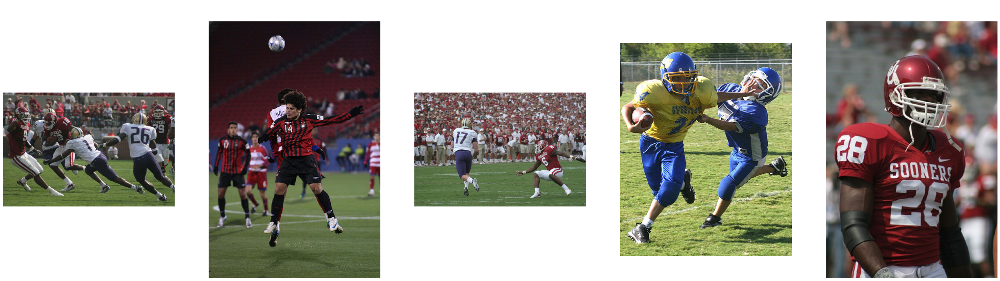

In [195]:
from tensorflow.keras.preprocessing.image import load_img
def database_results(database, sentence, embedder, n_results = 5):
  vector = embedder(sentence)
  score = []
  for k, v in database.items():
    p = similarity(v, vector)
    score.append((p,k))
  
  score.sort(reverse=True)
  return score[:n_results]

def result(query_result, img_path, sentence, n_results = 5):
  fig = plt.figure(figsize=(60,60))
  for n in range(1, n_results+1):
    fig.add_subplot(4,7,n)
    #print(query_result)
    nombre = query_result[n-1][1]
    puntaje = query_result[n-1][0]
    img = load_img(img_path+nombre)

    title = "Nombre:" + nombre + "\nScore: " + str(puntaje)[:7]
    plt.imshow(img)

    plt.title(title, fontsize=20, color='white')
    plt.axis('off')

sentence = "football"
result( database_results(database, sentence, embedder, 5) , images_path, sentence)

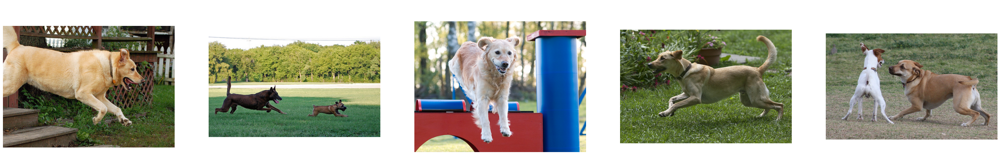

In [92]:
sentence = "dog"
result( database_results(database, sentence, embedder, 5) , images_path, sentence)

A photographer looks over the hills .


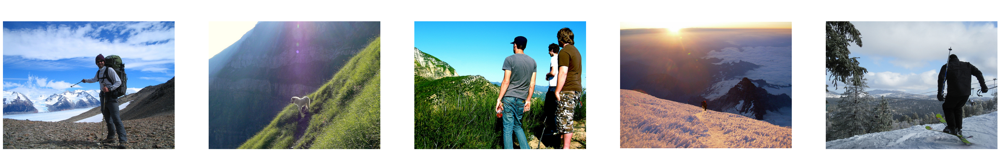

In [63]:
print(labels_train[10][0])
sentence = labels_train[10][0]
result( database_results(database, sentence, embedder, 5) , images_path, sentence)

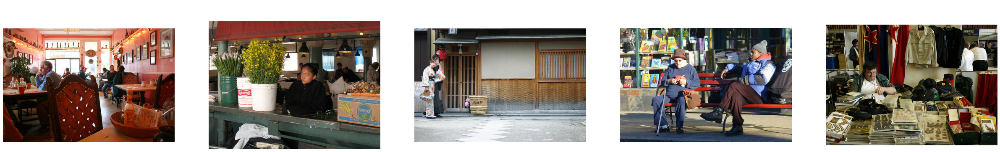

In [64]:
sentence = "kitchen"
result( database_results(database, sentence, embedder, 5) , images_path, sentence)

##Metrica: mAP

A boy holding a racket is standing in the grass .


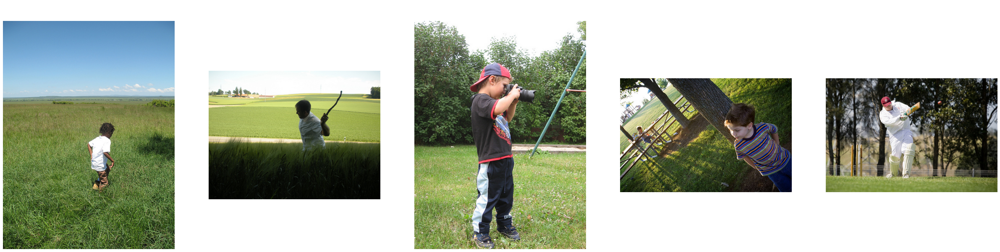

In [196]:
sentence = labels_train[40][0]
print(sentence)
images_predicted = database_results(database, sentence, embedder, 5)
score_predicted = list(np.array(images_predicted)[:,0])
images_predicted = list(np.array(images_predicted)[:,1])

result( database_results(database, sentence, embedder, 5) , images_path, sentence)

In [197]:
k = 1
score_final = []
corrects = 0
for i in range(len(images_predicted)):
  if float(score_predicted[i]) > 0.8:
    corrects += 1
    score_final.append(corrects/k)
  else:
    score_final.append(0)
  k+=1

In [198]:
score_final

[1.0, 1.0, 1.0, 1.0, 1.0]

In [200]:
np.mean(score_final)

1.0